# Part 1: Scraping the data

The first step of this project was scraping the DTU course database for data. This is very similar to that of the philosophers in wikipedia only that they were downloaded using the wikipedia API. We had to, however, circumvent some security mechanism (automated web browser re-direction) which lead to the use of selenium webdriver. Then the scraped data was structured so they could be exported as csv files. 

In [1]:
#The bypasser function used to get the pages
def getit(x):
    while True:
        browser = webdriver.Chrome()
        browser.get(x)
        if len(browser.page_source)>6000:
            mama = browser.page_source
            browser.quit()
            break
        else:
            browser.quit()
    return mama

**The whole script for scraping the content and structuring them as dataframes that can be exported as csv files. It should be noted that this still took a long time to complete due to the DTU course site safety mechanism forcing more loops to keep scraping process from being redirected to other pages**

In [2]:
# The code relies on the organized and consistent structure of the DTU course base
########
# To play with this code, ensure that you install selenium and google webdriver appropriately.

import urllib2
from bs4 import BeautifulSoup
from lxml import html
import xml.etree.ElementTree as ET
from selenium import webdriver
import unicodecsv as csv
from io import BytesIO
import re



# we start by creating a dictionary of departments, the key of the department is the unique number from the DTU 
# URL.

depts = {"1":u"Department of Applied Mathematics and Computer Science","10":u"Department of Physics","11": 
         u"Department of Civil Engineering", "12":u"Department of Environmental Engineering","13":u"Department of Transport",
        "23":u"National Food Institute", "24":u"National Veterinary Institute", "25": u"National Institute of Aquatic Resources",
         "26":u"Department of Chemistry","27":u"Department of Systems Biology", "28":u"Department of Chemical Engineering", "30":
        u"National Space Institute", "31":u"Department of Electrical Engineering", "33": u"Department of Micro and Nanotechnology",
        "34": u"Department of Photonics Engineering","41": u"Department of Mechanical Engineering","42":
         u"DTU Management Engineering","46": u"DTU Wind Energy", "47": u"DTU", "83": u"Other courses", "IHK":u"DTU Diplom"}

# use beautifulsoup to extract the table from the homepage of the coursebase
for bros in depts:
    
    columns = [u"COURSE NUMBER",
               u"COURSE NAME",
               u"LANGUAGE OF INSTRUCTION",
               u"CREDIT LOAD",
               u"YEAR",
               u"SCHEDULE",
               u"COURSE TYPE",
               u"DEPARTMENT",
               u"GENERAL COURSE OBJECTIVES",
               u"LEARNING OBJECTIVES",
               u"CONTENT",
               u"RECOMMENDED PREREQUISITES",
               u"COURSE RESPONSIBLE",
               ]
    
    
    with open(depts[bros]+u'.csv', 'w') as csvfile:
        fieldnames = columns
        writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
        writer.writeheader()
    
    #Use the baseurl to get the tables in the homepage of each department
    baseurl = "http://kurser.dtu.dk/search?CourseCode=&SearchKeyword=&SchedulePlacement=&Department=%s&CourseType=&TeachingLanguage=" %bros
    
    
    buks = getit(baseurl)
    
    buks = BeautifulSoup(buks,"lxml")
    b = list()
    fin = []
    
    
    for row in buks('table', {'class': 'table'})[1].tbody('tr'):
        b.append(list(row('td')))
        
    b = b[1:]
    
    for pops in b:
        if len(pops)>=4:
            fin.append(pops)
        else:
            break
            
        
    for ro in range(len(fin)):
        v = []
        fil = filter(None,fin[ro][1].get_text().split("\n"))#[3]#.split("-")[1]#.split("|")
        v.append(fil[0].split("-")[0])
        v.append(fil[0].split("-")[1])
        v.append(fil[1].split("|")[0])
        v.append(fil[1].split("|")[1])
        v.append(fil[1].split("|")[2])
        v.append(' '.join(fil[2:]))
        v.append(','.join(fin[ro][2].get_text().split()))
        v.append(depts[bros])
        
        
        #Enter the webpage of each course and extract appropriate table using chrome inspect element as guide
        urlsec = "http://kurser.dtu.dk/course/%s" %v[0]
        twobuks = getit(urlsec)
        twobuks = BeautifulSoup(twobuks,"lxml")
        gg = None
        hh = None
        ii = None
        tempor = []
        stanlo = twobuks.find_all("div",class_="box")
        
        
        for tf in range(len(list(stanlo[1]))):
            try:
                if list(stanlo[1])[tf].text=="Learning objectives":
                    gg = tf
            except:
                pass
        for ie in list(stanlo[1])[1:gg]:
            try:
                tempor.append(ie.get_text(' '))
            except:
                tempor.append(ie)
        v.append(filter(None,''.join(tempor)))
        
        tempor = []
        gg = list(stanlo[1])[gg+2:]
        for tr in range(len(gg)):
            try:
                if gg[tr].text=="Content":
                    hh = tr
            except:
                pass
            
        for eg in gg[0:hh]:
            try:
                tempor.append(eg.get_text(' '))
            except:
                tempor.append(eg)
        v.append(filter(None,''.join(tempor)))
        
        hh = gg[hh+1:]
        for li in range(len(hh)):
            try:
                if hh[li].name == 'div':
                    ii = li
                    break
            except:
                pass
        
        tempor = []

        for cj in hh[:ii]:
            try:
                tempor.append(cj.get_text(' '))
            except:
                tempor.append(cj)
        v.append(filter(None,''.join(tempor)))
        
        gg = None
        hh = None
        tempor = []
        
        stanlo = twobuks.find_all("table")
        gg = stanlo[1].find_all("tr")
        
        for i in range(len(gg)):
            if "Recommended prerequisites" in gg[i].get_text():
                hh = ' '.join([k.text for k in list(gg[i])[1:]])
                hh = re.sub(ur'[\W_]+', u' ', hh, flags=re.UNICODE)
                hh = [ij for ij in hh.split() if  len(ij) == 5]
                hh = u','.join(set([ip for ip in hh if ip.isalpha()==False]))
                v.append(hh)
                
            else:
                tempor.append('None')
                
        if len(tempor)==len(gg):
            v.append(u'None')
        
        
        tempor = []
        gg = stanlo[2].find_all("tr")
        
        for crew in range(0,len(gg[0].find_all("a")),2):
            it = gg[0].find_all("a")[crew].text
            tempor.append(it)
            
        v.append(u','.join(tempor))
        

        with open(depts[bros]+".csv",'a') as b:
            wr = csv.writer(b,dialect='excel',encoding='utf-8')
            wr.writerow(v)

# Part 2: Creating the whole network

The first approach to analyzing the data was to create a DTU course network where the link/connection between the courses where the recommended prerequisites that could be found on their content site

In [3]:
import re
import networkx as nx
import matplotlib.pyplot as plt
import os
import pandas as pd
import operator
import community
from __future__ import division
import itertools
from collections import defaultdict
from itertools import izip_longest
import operator
import numpy as np
from collections import Counter
from networkx.algorithms import bipartite
%matplotlib inline

In [4]:
#first part was retrieving the data which is ouputted as csv files containg
#course information for each course within each department
#next part is about creating a network of all the courses
#firstly the csv files containing the data are loaded into python
#overview of csv files content:
#checkout assignment 2 for some network analysis 

#COURSE NUMBER,COURSE NAME,LANGUAGE OF INSTRUCTION,CREDIT LOAD,YEAR,SCHEDULE,COURSE TYPE,DEPARTMENT,GENERAL COURSE OBJECTIVES,LEARNING OBJECTIVES,CONTENT,RECOMMENDED PREREQUISITES,COURSE RESPONSIBLE

rootdir='C:/Users/DRC/Desktop/social_csv_folder'
list_of_df_for_each_department={}
for filename in os.listdir(rootdir):
    if filename.endswith('.csv'):
        #print filename
        df=pd.read_csv(rootdir+'/'+filename,converters={'COURSE NUMBER': lambda x: str(x),'RECOMMENDED PREREQUISITES':lambda x: str(x)})
        list_of_df_for_each_department[filename]=df

In [5]:
# we merge all the dataframes to complete a complete network across all departmetns
merged_df=pd.concat(list_of_df_for_each_department.values(),join='inner')

In [6]:
#we clean the dataframe for nan values
cleaned_merged=merged_df.dropna(thresh=len(merged_df.columns.values))

In [7]:
#printing a transposed version of the dataframe to get an overview of the columns 
cleaned_merged.head().transpose()

,1,3,5,7,9
COURSE NUMBER,27002,27004,27007,27008,27015
COURSE NAME,Life Science,"Health, Diseases and Technology",Biotechnology and communication,Life Science,Introductory Project in Biotechology / Human ...
LANGUAGE OF INSTRUCTION,Danish,Danish,Danish,English,Danish
CREDIT LOAD,5 ECTS,10 ECTS,10 ECTS,5 ECTS,10 ECTS
YEAR,2016/2017,2016/2017,2016/2017,2016/2017,2016/2017
SCHEDULE,E1B (Thurs 13-17),E4B (Fri 8-12) and January,E4B (Fri 8-12) and January,F5B (Wed 13-17),E5A (Wed 8-12) and January
COURSE TYPE,BSc,BSc,BSc,BSc,BSc
DEPARTMENT,Department of Systems Biology,Department of Systems Biology,Department of Systems Biology,Department of Systems Biology,Department of Systems Biology
GENERAL COURSE OBJECTIVES,\nThe students should based on the cell acquir...,\nThe course introduces the students to the ba...,\nThe course provides the student with insight...,\nThe students should based on the cell acquir...,\nBy performing a review project within biotec...
LEARNING OBJECTIVES,"Describe the spatial, logistic, and structural...",Describe in general terms the processes in dev...,Describe examples of the work areas of biotech...,"Describe the spatial, logistic, and structural...","Perform a comprehensive literature search, to ..."


In [8]:
#retrieving the list of nodes i.e. the courses (represented by course number) from the dataframe and listing them
list_of_nodes=cleaned_merged['COURSE NUMBER'].tolist()

In [9]:
#we create a dict with course names and correponding course number
#since it could come in handy later
list_of_nodes_names=cleaned_merged['COURSE NAME'].tolist()

In [10]:
course_dict={}
for i in range(0,len(list_of_nodes_names)):
    course_dict[list_of_nodes[i]]=list_of_nodes_names[i]

# Type 1: Course network by prerequisites

We created the whole network using the recommended prerequisites found on each course page. The recommended prerequisites are direct links to other courses.

In [11]:
# now we list the links by using the prerequisites of each course
list_of_prerequistites=cleaned_merged['RECOMMENDED PREREQUISITES'].tolist()
#cleaned__list=filter(lambda v: v==v, list_of_nodes)


In [12]:
#use list_of_nodes
#we create a dict that contain the nodes and its prerequisites i.e. the edge list
links_dict={}
for i in range(0,len(list_of_nodes)):
    links_dict[list_of_nodes[i]]=list_of_prerequistites[i]

In [13]:
#the prerequistites (represented by course number) are in a string format, so it is neccessary to utilize a reqular expression to extract the course numbers in each "string" of course numbers (courses that are prerequisites) and list them in a pythong list numerical objcet
#this extraction code ignores and passes prerequisites that are nan or none values i.e. non-existent prerequisites (no outgoing links). 
new_dict_list_of_links={}
for k,v in links_dict.items():
    try:
        temp_list=re.findall('\w+',v)
        new_dict_list_of_links[k]=temp_list
    except TypeError:
        pass

In [14]:
G2=nx.DiGraph(new_dict_list_of_links)

In [15]:
list_of_links=G2.edges()

In [16]:
G2.remove_node('None')

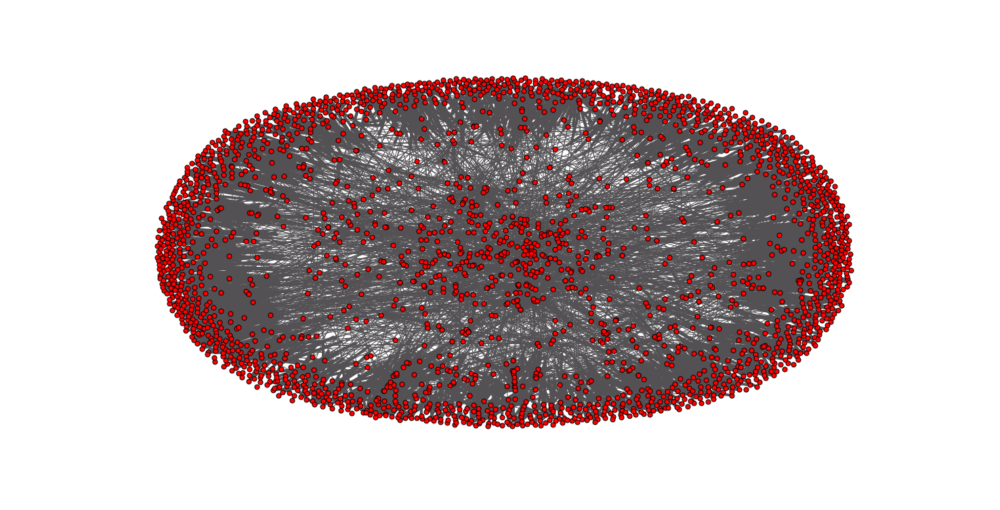

In [17]:
pos = pos=nx.spring_layout(G2, scale=5)
plt.figure(num=None, figsize=(20, 10), dpi=1500)
nx.draw(G2,pos, edge_color='#535154',node_size=50)
plt.savefig('C:/Users/DRC/Desktop/project for social graphs study/webpage for social graph study/course_networ_req.png')
plt.show()

**We review which course is most central in this network by betweenness central analysis. The most central course can be considered a pretty significant course by this value**

In [18]:
betweenness_cen_course=nx.betweenness_centrality(G2)

In [19]:
sorted_x = sorted(betweenness_cen_course.items(), key=operator.itemgetter(1),reverse=False)
print "Most central courses in descending order: \n"
for k,v in sorted_x[-10:]:
    print "Course: %s" %k,"\t Betweenness value: %r"%v

Most central courses in descending order: 

Course: 02131 	 Betweenness value: 9.635616786915753e-06
Course: 41511 	 Betweenness value: 9.692464083593721e-06
Course: 41560 	 Betweenness value: 1.210847419240741e-05
Course: 02402 	 Betweenness value: 1.2148267300081986e-05
Course: 41704 	 Betweenness value: 1.7054189003390714e-05
Course: 41401 	 Betweenness value: 1.790689845356025e-05
Course: 41502 	 Betweenness value: 2.4629091285730088e-05
Course: 41612 	 Betweenness value: 2.489911594495044e-05
Course: 01035 	 Betweenness value: 3.510320569864589e-05
Course: 41501 	 Betweenness value: 6.733562291505434e-05


**Then we calculate the in-degree and out-degrees to see if there are any correlation between which courses have the most in-degrees and out-degrees**

In [20]:
#we use networkx to calculate varous centrality values 
deg_cen=nx.degree_centrality(G2)
in_deg_cen=nx.in_degree_centrality(G2)
out_deg_cen=nx.out_degree_centrality(G2)

**The first thing we do is printing the top 5 courses by in-degree and out-degree**

In [21]:
sorted_in_deg = sorted(in_deg_cen.items(), key=operator.itemgetter(1),reverse=True)
for i in range(5):
    print "The Course named: %s. \t Betweenness centrality value is: %s." %(sorted_in_deg[i][0],sorted_in_deg[i][1])



The Course named: 01005. 	 Betweenness centrality value is: 0.0255986787779.
The Course named: 02631. 	 Betweenness centrality value is: 0.0177539223782.
The Course named: 02402. 	 Betweenness centrality value is: 0.0148637489678.
The Course named: 02633. 	 Betweenness centrality value is: 0.014450867052.
The Course named: 01035. 	 Betweenness centrality value is: 0.0127993393889.


In [22]:
sorted_out_deg = sorted(out_deg_cen.items(), key=operator.itemgetter(1),reverse=True)
for i in range(5):
    print "The Course named: %s. \t Betweenness centrality value is: %s." %(sorted_out_deg[i][0],sorted_out_deg[i][1])


The Course named: 62233 . 	 Betweenness centrality value is: 0.00908340214699.
The Course named: 11080 . 	 Betweenness centrality value is: 0.00619322873658.
The Course named: 02526. 	 Betweenness centrality value is: 0.00578034682081.
The Course named: 41663. 	 Betweenness centrality value is: 0.00536746490504.
The Course named: 41612. 	 Betweenness centrality value is: 0.00536746490504.


In [23]:
#Getting eigenvalue centrality for each node(philosopher) in-degree and out-degree using the networkx package
in_eigen_centrality = nx.eigenvector_centrality(G2)
out_eigen_centrality = G2.reverse()
out_eigen_centrality = nx.eigenvector_centrality(out_eigen_centrality)
sorted_in_eigen_centrality= sorted(in_eigen_centrality.items(), key=operator.itemgetter(1),reverse=True)
sorted_out_eigen_centrality= sorted(out_eigen_centrality.items(), key=operator.itemgetter(1),reverse=True)

In [24]:
print "Courses ranked by their in-degree eigenvalue centrality: \n"
for i,j in sorted_in_eigen_centrality[0:5]:
    print i,j
print "__________________________________________________________________\n"
print "Courses ranked by their out-degree eigenvalue centrality: \n"
for k,v in sorted_out_eigen_centrality[0:5]:
    print k,v

Courses ranked by their in-degree eigenvalue centrality: 

02315 0.77395278483
02313 0.539486425522
02312 0.234471737903
02314 0.234466359309
01005 6.45431281001e-05
__________________________________________________________________

Courses ranked by their out-degree eigenvalue centrality: 

02368 0.410986298529
02313 0.373350078705
62583  0.356957549843
62584  0.356957549843
02315 0.286536272294


In [25]:
#listing top outliers
print "The top outliers are: \n"
for outd, ind in zip(out_eigen_centrality.items(),
                     in_eigen_centrality.items()):
    if outd[1] > 0.15 and ind[1] < 0.002:
        print "Course number: ",outd[0], 'has ingoing degree', ind[1],'and outdoing degree', outd[1]

The top outliers are: 

Course number:  62583  has ingoing degree 0.0 and outdoing degree 0.356957549843
Course number:  02368 has ingoing degree 0.0 and outdoing degree 0.410986298529
Course number:  62584  has ingoing degree 0.0 and outdoing degree 0.356957549843


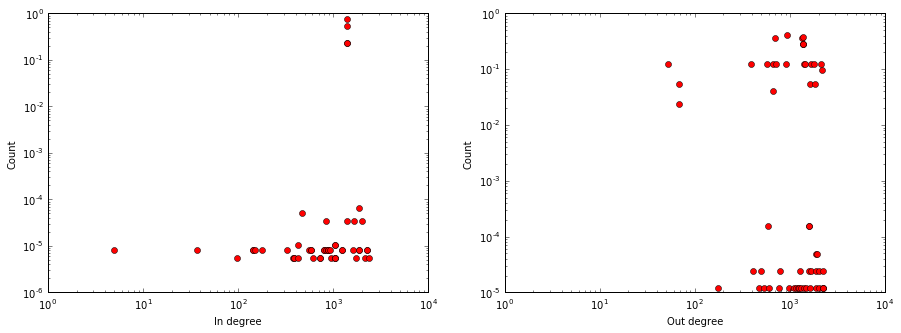

In [26]:
plt.figure(figsize=(15, 5), facecolor='w', edgecolor='k')
plt.subplot(1,2,1)
plt.yscale('log')
plt.xscale('log')
plt.plot(in_eigen_centrality.values(),'ro')
plt.xlabel("In degree")
plt.ylabel("Count")

plt.subplot(1,2,2)
plt.plot(out_eigen_centrality.values(),'ro')
plt.yscale('log')
plt.xscale('log')
plt.xlabel("Out degree")
plt.ylabel("Count")
plt.savefig('C:/Users/DRC/Desktop/project for social graphs study/webpage for social graph study/plots_of_degrees_eigen.png')
plt.show()

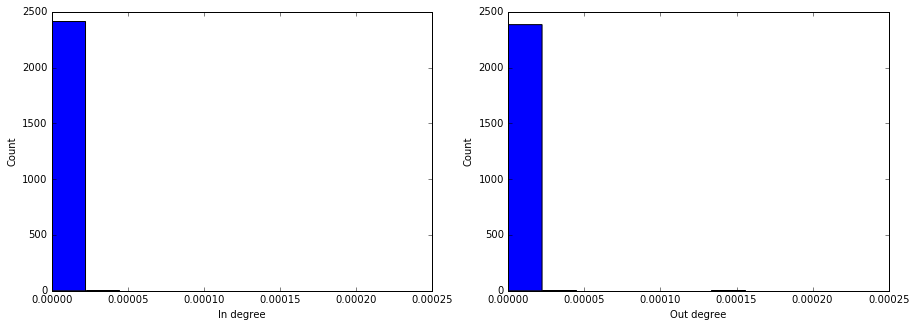

In [27]:
plt.figure(figsize=(15, 5), facecolor='w', edgecolor='k')
plt.subplot(1,2,1)
plt.hist(in_eigen_centrality.values(), bins=np.linspace(0,0.00020,10))
plt.xlabel("In degree")
plt.ylabel("Count")

plt.subplot(1,2,2)
plt.hist(out_eigen_centrality.values(), bins=np.linspace(0,0.00020,10))
plt.xlabel("Out degree")
plt.ylabel("Count")
plt.savefig('C:/Users\DRC/Desktop/project for social graphs study/webpage for social graph study/bar_plots_of_degrees_eigen.png')
plt.show()

** We then plot the in-degrees and out_degrees in plots to see if there are any significant outliers**

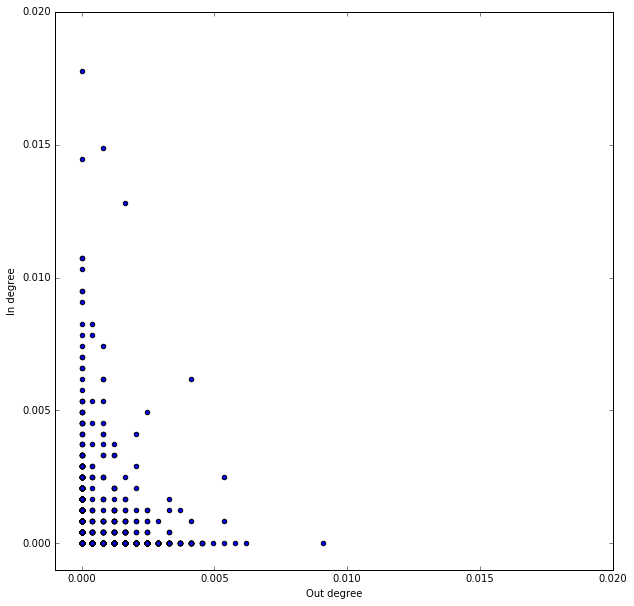

In [28]:
#Firstly a scatter plot of the in-degrees vs. out-degrees are plotted
plt.figure(figsize=(10, 10), facecolor='w', edgecolor='k')
plt.scatter(out_deg_cen.values(), 
            in_deg_cen.values())
plt.xlabel('Out degree')
plt.ylabel('In degree')

#plt.axis([-2,55,-2,140])
#plt.axis([0,15,0,20])
plt.xlim(-0.001, 0.020)
plt.ylim(-0.001,0.020)
plt.savefig('C:/Users/DRC\Desktop/project for social graphs study/webpage for social graph study/scatter_plot_cen.png')
plt.show()

In [29]:
#listing top outliers
print "The top outliers are: \n"
for outd, ind in zip(out_deg_cen.items(),
                     in_deg_cen.items()):
    if outd[1] > 0.0050 and ind[1] < 0.002:
        print "Course number: ",outd[0], 'has ingoing degree', ind[1],'and outdoing degree', outd[1]

The top outliers are: 

Course number:  11080  has ingoing degree 0.0 and outdoing degree 0.00619322873658
Course number:  62233  has ingoing degree 0.0 and outdoing degree 0.00908340214699
Course number:  02526 has ingoing degree 0.0 and outdoing degree 0.00578034682081
Course number:  41663 has ingoing degree 0.0 and outdoing degree 0.00536746490504
Course number:  02343 has ingoing degree 0.000825763831544 and outdoing degree 0.00536746490504


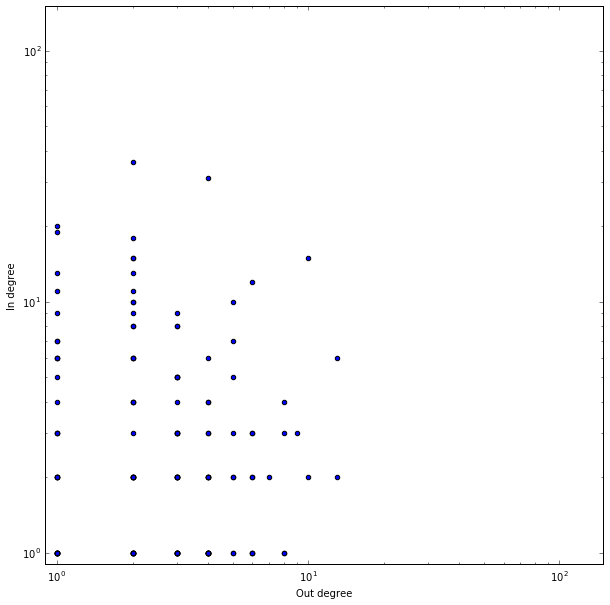

In [30]:
#Firstly a scatter plot of the in-degrees vs. out-degrees are plotted
plt.figure(figsize=(10, 10), facecolor='w', edgecolor='k')
plt.scatter(G2.out_degree().values(), 
            G2.in_degree().values())
plt.xlabel('Out degree')
plt.ylabel('In degree')
plt.xscale('log')
plt.yscale('log')
#plt.axis([-2,55,-2,140])
#plt.axis([0,15,0,20])
plt.xlim(0.0, 10.)
#plt.ylim(0.,10.)
plt.xlim(9e-1, 1.5e2)
plt.ylim(9e-1, 1.5e2)
plt.savefig('C:/Users/DRC\Desktop/project for social graphs study/webpage for social graph study/scatter_plot.png')
plt.show()

For looking at the differences. We look at the largest disparities between degrees i.e. outliers in this case we are looking at the ones with comparetivel a significally larger value of out-degrees compared to in-degrees.

In [31]:
#listing top outliers
print "The top outliers are: \n"
for outd, ind in zip(G2.out_degree().items(),
                     G2.in_degree().items()):
    if outd[1] > 10 and ind[1] < 2:
        print "Course number: ",outd[0], 'has ingoing degree', ind[1],'and outdoing degree', outd[1]

The top outliers are: 

Course number:  11080  has ingoing degree 0 and outdoing degree 15
Course number:  42086  has ingoing degree 0 and outdoing degree 11
Course number:  62193  has ingoing degree 0 and outdoing degree 11
Course number:  62233  has ingoing degree 0 and outdoing degree 22
Course number:  02526 has ingoing degree 0 and outdoing degree 14
Course number:  30740  has ingoing degree 0 and outdoing degree 11
Course number:  41663 has ingoing degree 0 and outdoing degree 13
Course number:  30742  has ingoing degree 0 and outdoing degree 11
Course number:  11375  has ingoing degree 0 and outdoing degree 12


We then plot the the degree values as bar plots

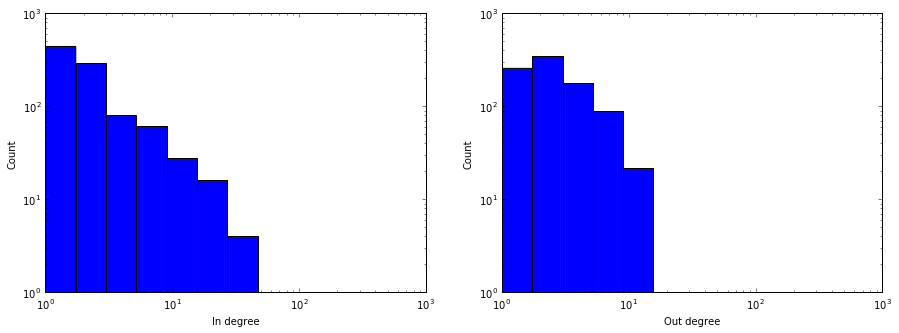

In [32]:
plt.figure(figsize=(15, 5), facecolor='w', edgecolor='k')
plt.subplot(1,2,1)
plt.hist(G2.in_degree().values(), bins=np.logspace(0,2.15,10))
plt.xlabel("In degree")
plt.ylabel("Count")
plt.xscale('log')
plt.yscale('log')

plt.subplot(1,2,2)
plt.hist(G2.out_degree().values(), bins=np.logspace(0,2.15,10))
plt.xlabel("Out degree")
plt.ylabel("Count")
plt.xscale('log')
plt.yscale('log')
plt.savefig('C:/Users\DRC/Desktop/project for social graphs study/webpage for social graph study/bar_plots_of_degrees.png')
plt.show()

In this course network based on prerequisites it could be interesting to test out a hypothesis that states that the number of nodes (courses) that have the shortest path being one or less, is more frequent that higher number paths, meaning that the number of courses that require no prerquisites or just 1 are morer than the ones that require several prereuisites (i.e. the prerequisite of a course might have prerequisites itself and so on). 

In [33]:
#getting degree sequence
G_degree_sequence = [d for n,d in G2.degree().iteritems()]


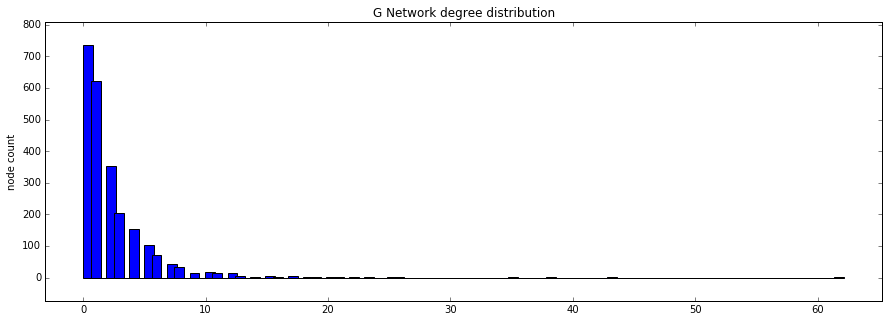

In [34]:

#computing histogram
G_val, G_bins = np.histogram(G_degree_sequence,bins=100)
G_bins = np.delete(G_bins, -1)
plt.figure(figsize=(15, 5), facecolor='w', edgecolor='k')
# Two subplots, the axes array is 1-d
plt.margins(0.05, 0.1) #inner margin 
plt.bar(G_bins, G_val,width=0.80, color='b')
plt.ylabel('node count')
plt.title('G Network degree distribution')
plt.savefig('C:/Users/DRC/Desktop/project for social graphs study/webpage for social graph study/Degree-distrubution.png')
plt.show()

It can be seen in the plot that a majority of the nodes have degree 1 and the number of them is decreasing with higher degree. This can be interpreted  as a graph/netowkr with a lot of single nodes connected to one big cluster. We can also see that there is not a single node with a degree 0 which means that if we pick every single node there is always a path to all nodes in the network from that node.

In [35]:
#we use networkx shortest path function
lenght_list=[]
for key,value in nx.shortest_path_length(G2).items():
    for k2,v2 in value.items():
        lenght_list.append(v2)

In [36]:
C1=Counter(lenght_list)
dic_C1=dict(C1)

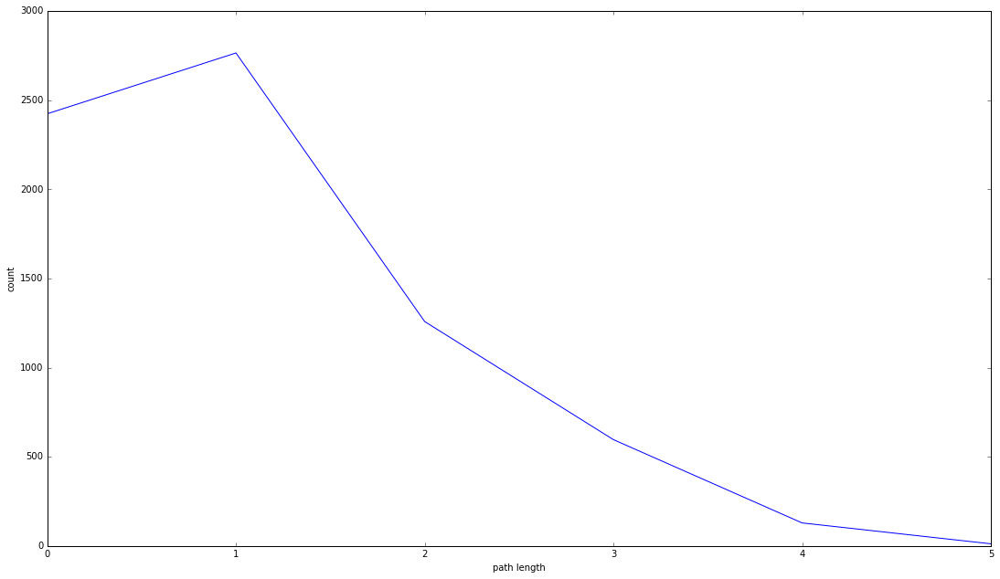

In [37]:
#Plotting the distrubution of lenghts
plt.plot(dic_C1.values())
plt.ylabel('count')
plt.xlabel('path length')
fig = plt.gcf()
fig.set_size_inches(18.5, 10.5, forward=True)
plt.savefig('C:/Users/DRC\Desktop/project for social graphs study/webpage for social graph study/lenght_graph.png')

The hypothesis seems to have been pretty much confirmed,

**It is also be interested to look at the communities in this network to compare the best partition algorithm to the actual communities(i.e. departments).Looking at assotativity will also denote telling analytical data**

In [38]:
#using  networkx to create the prober subgraph using the weakly connected component (WCC)
#generating corresponding undirected graph to the philosopher directed graph

G3 = max(nx.weakly_connected_component_subgraphs(G2,copy=True),key=len)
H = G3.to_undirected()

In [39]:
#networkx function to get the assortativity
r = nx.degree_assortativity_coefficient(H)
print "Assortativity of the undirected graph: %s" %r

Assortativity of the undirected graph: -0.0667934917309


The negative value indicate that smiliar high-degree courses do not show a  tendency to link to other high-degree nodes.

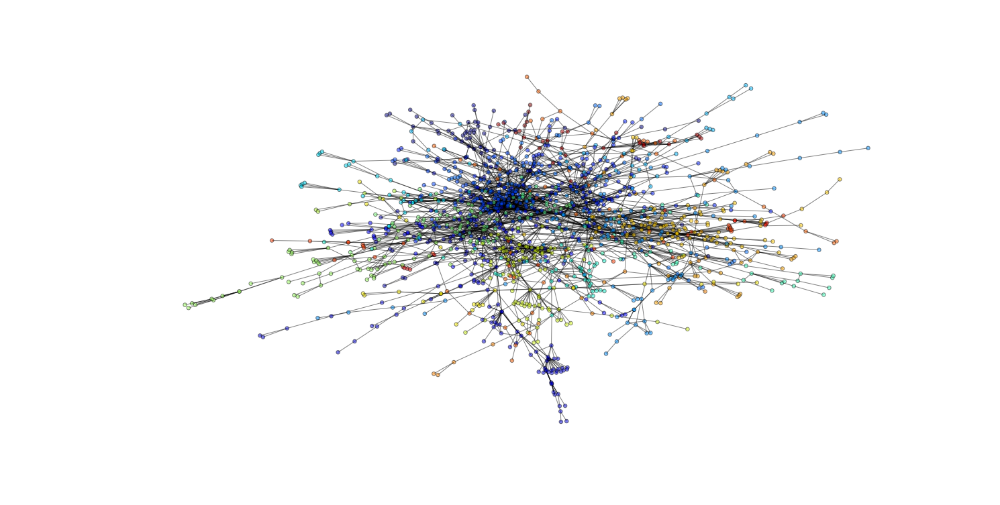

In [40]:
#using the community package to calculate the modularity using the Louvain-algroithm
#for directed graphs the partition has to be set manually. in our case we can set it to represent the 21 departments
#part = community.best_partition(H)
part = community.best_partition(H)
pos=nx.spring_layout(H, scale=5)
values = [part.get(node) for node in H.nodes()]
plt.figure(num=None, figsize=(20, 10), dpi=1500)    
nx.draw_spring(H, cmap = plt.get_cmap('jet'), node_color = values, node_size=30, with_labels=False,alpha=0.5)
plt.savefig('C:/Users/DRC\Desktop/project for social graphs study/webpage for social graph study/communities_graph.png')
plt.show()


**We will also look at the moudlarity as this value can be compared to the modularity of the network containing the actual partition (departmnents as communities) which again denotes interesting analytical data**

In [41]:
mod = community.modularity(part,H)
print "modularity:", mod

modularity: 0.805352995503


# Part 2: Department based Network

In [42]:
#first part was retrieving the data which is ouputted as csv files containg
#course information for each course within each department
#next part is about creating a network of all the courses
#firstly the csv files containing the data are loaded into python
#overview of csv files content:
#checkout assignment 2 for some network analysis 

#COURSE NUMBER,COURSE NAME,LANGUAGE OF INSTRUCTION,CREDIT LOAD,YEAR,SCHEDULE,COURSE TYPE,DEPARTMENT,GENERAL COURSE OBJECTIVES,LEARNING OBJECTIVES,CONTENT,RECOMMENDED PREREQUISITES,COURSE RESPONSIBLE

rootdir='C:/Users/DRC/Desktop/social_csv_folder'
list_of_df_for_each_department={}
for filename in os.listdir(rootdir):
    if filename.endswith('.csv'):
        #print filename
        df=pd.read_csv(rootdir+"/"+filename,converters={'COURSE NUMBER': lambda x: str(x),'RECOMMENDED PREREQUISITES':lambda x: str(x)})
        df2=df.dropna(thresh=11)
        list_of_df_for_each_department[filename]=df2

In [43]:
super_list_of_nodes=[]
for i in range(0,len(list_of_df_for_each_department.values())):
               list_of_nodes=list_of_df_for_each_department.values()[i]['COURSE NUMBER'].tolist()
               super_list_of_nodes.append(list_of_nodes)
               
super_list_of_links=[]
for i in range(0,len(list_of_df_for_each_department)):
               list_of_nodes=list_of_df_for_each_department.values()[i]['RECOMMENDED PREREQUISITES'].tolist()
               super_list_of_links.append(list_of_nodes)

In [44]:
list_of_dicts=[]
for i in range(0,len(super_list_of_nodes)):
    sub_dict={}
    for j in range(0,len(super_list_of_nodes[i])):
        sub_dict[super_list_of_nodes[i][j]]=super_list_of_links[i][j]
    list_of_dicts.append(sub_dict)


In [45]:
new_list_of_dicts={}
for i in range(0,len(list_of_dicts)):
    new_dict_list_of_links={}
    for k,v in list_of_dicts[i].items():
        try:
            temp_list=re.findall('\w+',v)
            new_dict_list_of_links[k]=temp_list
        except TypeError:
            pass
    new_list_of_dicts[list_of_df_for_each_department.keys()[i]]=new_dict_list_of_links

In [46]:
new_dict={ k: v for d in new_list_of_dicts.values() for k, v in d.items() }

In [47]:
final_length=0
for i in range(0,len(new_list_of_dicts)):
    final_length = final_length + len(new_list_of_dicts.values()[i])
print final_length

1696


In [48]:
c=0
color_map_list=[]
for k,v in new_list_of_dicts.items():
    c= c + 1
    for i in range(0,len(v.keys())):
        color_map_list.append(c)

In [49]:
len(color_map_list)

1696

In [50]:
temp_dict={}
for k,v in new_dict.items():
    for item in v: 
        temp_dict[k]=item

In [51]:
tuple_list_links=temp_dict.items()

In [52]:
G=nx.DiGraph()
G.add_nodes_from(new_dict.keys())
G.add_edges_from(tuple_list_links)

In [53]:
G.remove_node('None')

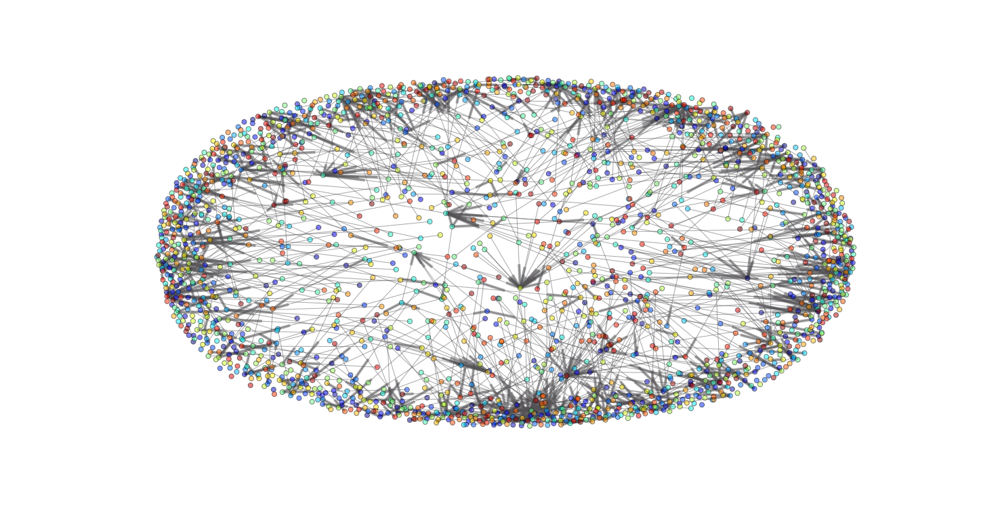

In [54]:
plt.figure(num=None, figsize=(20, 10), dpi=1500)   
pos = nx.spring_layout(G,scale=5, k=0.15, iterations=50)
nx.draw(G,pos, edge_color='#535154',node_color=range(len(G.nodes())),node_size=50,cmap = plt.get_cmap('jet'),with_labels=False,alpha=0.5)
plt.savefig('C:/Users/DRC/Desktop/project for social graphs study/webpage for social graph study/colored_network_communities.png')
plt.show()

To get a better overview for later we draw graphs for each department and saves them.

In [55]:
def department_pic(dict_list,name):
    sub_dict={}
    plt.figure(num=None, figsize=(20, 10), dpi=1500)
    G2=nx.DiGraph(dict_list)
    pos = nx.spring_layout(G2,scale=5, k=0.15, iterations=50)
    #print str(count / size)
    nx.draw(G2,pos, edge_color='#535154',node_size=50,alpha=0.5,with_labels=False)
    plt.savefig('C:/Users/DRC/Desktop/project for social graphs study/cleaned_new_pic/'+name+'.png')
    plt.show()
    G2 = max(nx.weakly_connected_component_subgraphs(G2,copy=True),key=len)
    H2= G2.to_undirected()
    part = community.best_partition(H2)
    mod = community.modularity(part,H2)
    print "Name and Modularity for department(community) is: %r " %name,mod
    sub_dict[name]=mod
    return name,mod
    

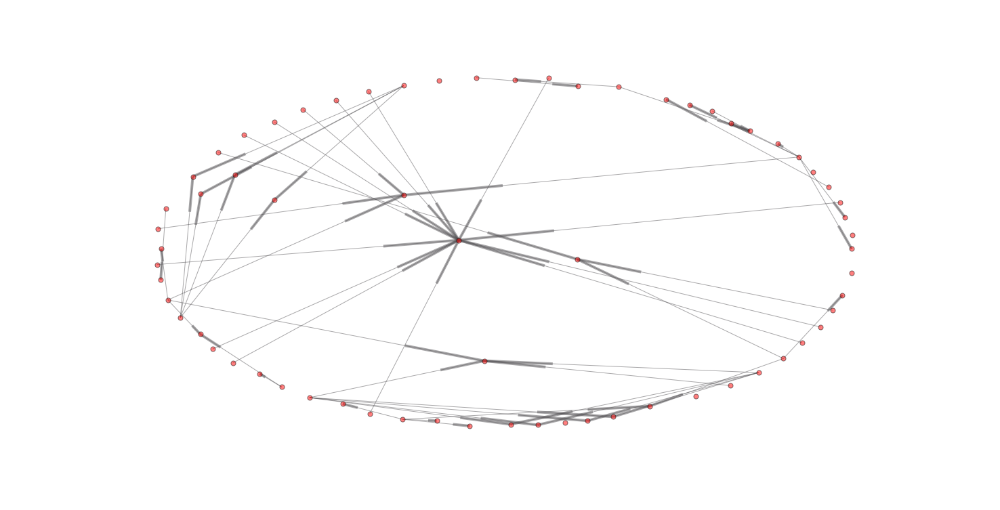

Name and Modularity for department(community) is: 'DTU.csv'  0.5656


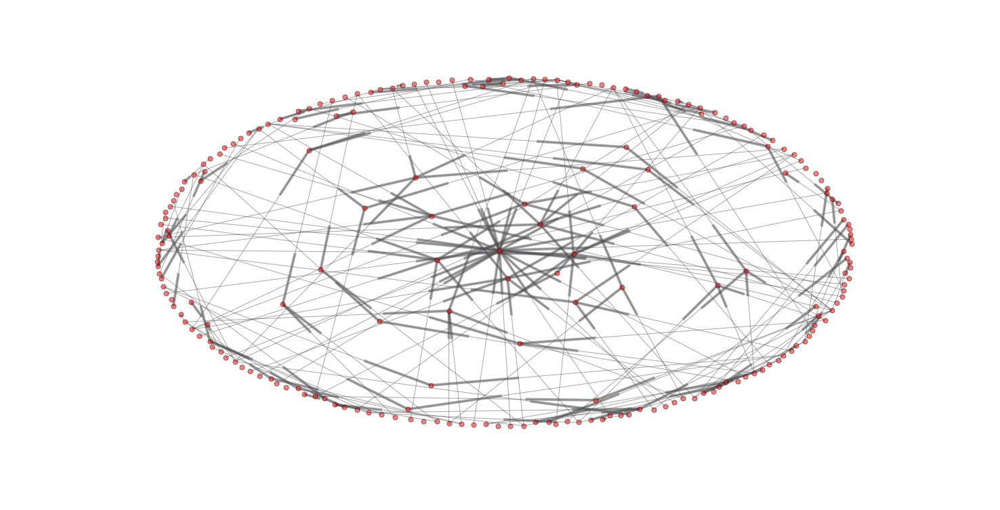

Name and Modularity for department(community) is: 'Department-of-Electrical-Engineering.csv'  0.785183983123


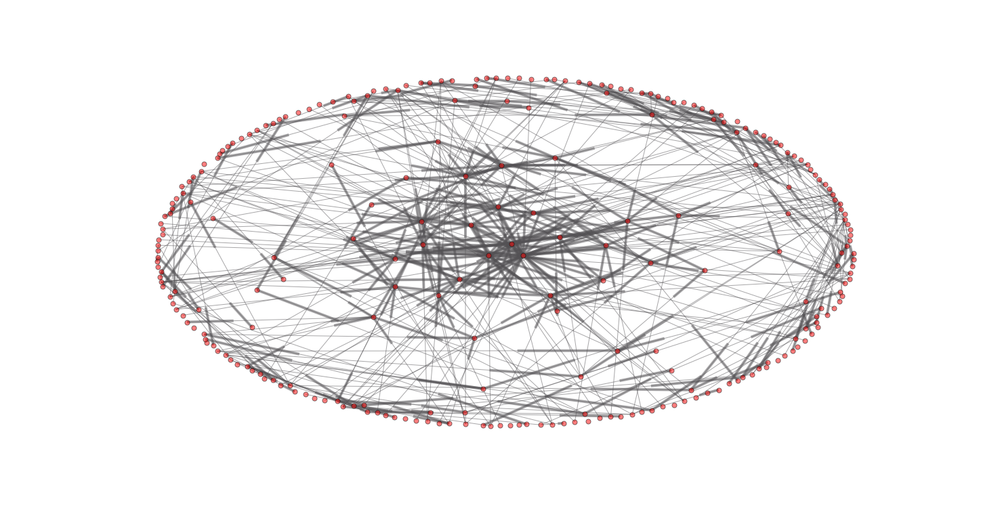

Name and Modularity for department(community) is: 'Department-of-Applied-Mathematics-and-Computer-Science.csv'  0.683374167899


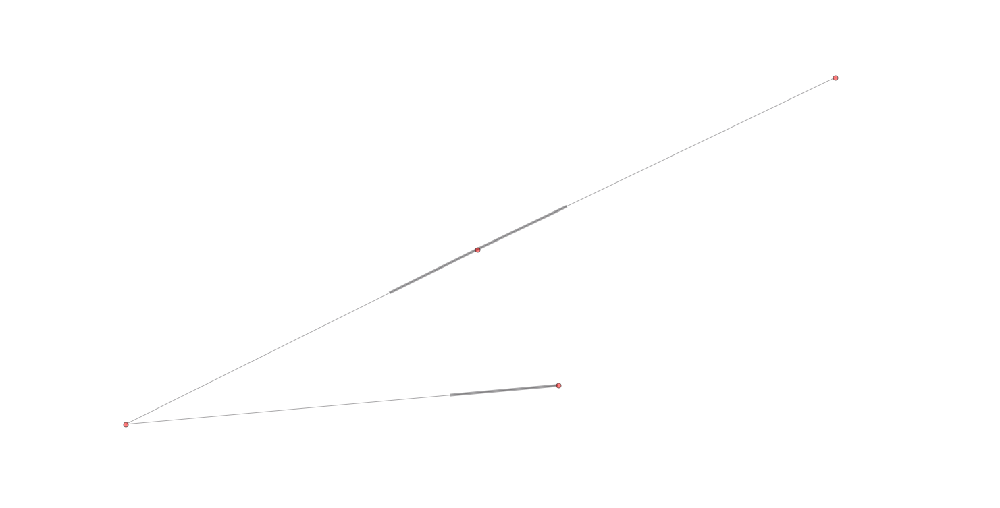

Name and Modularity for department(community) is: 'Department-of-Transport.csv'  0.166666666667


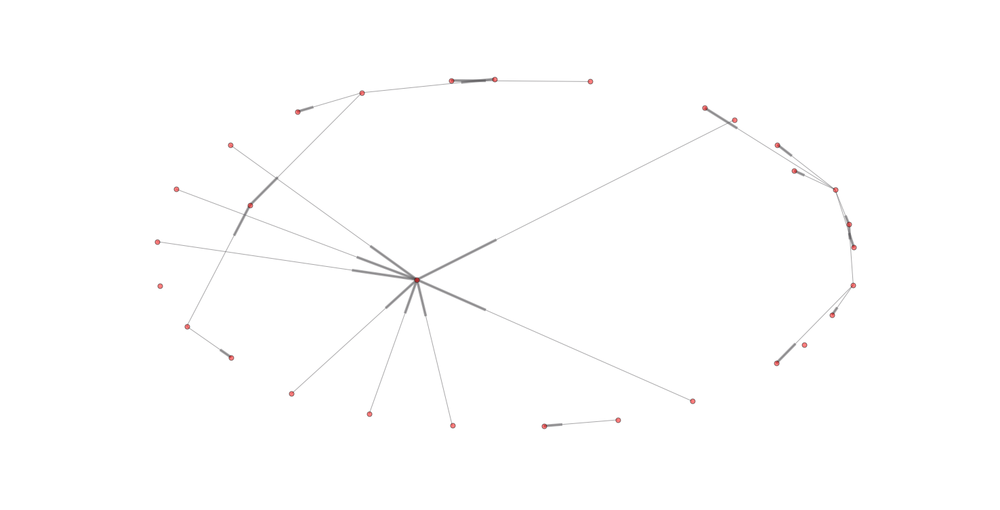

Name and Modularity for department(community) is: 'National-Veterinary-Institute.csv'  0.3671875


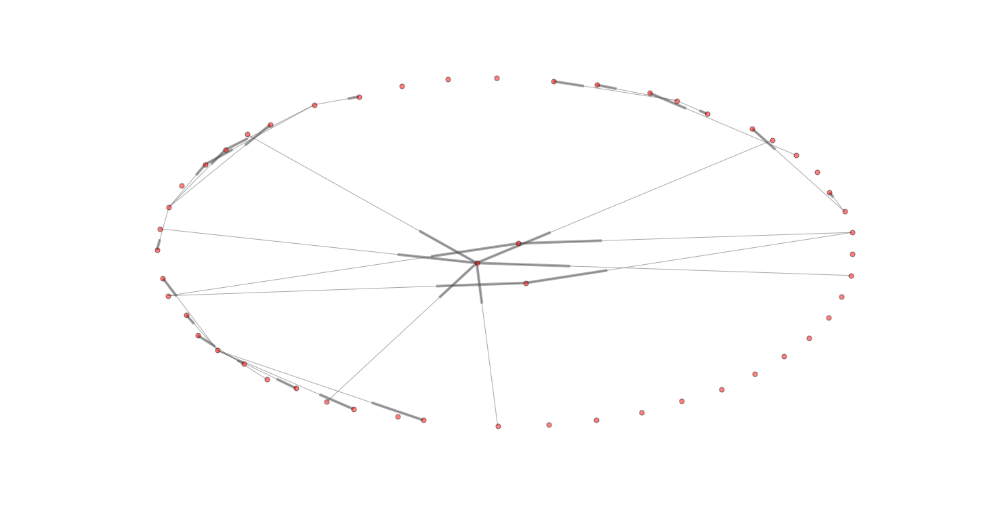

Name and Modularity for department(community) is: 'Department-of-Micro-and-Nanotechnology.csv'  0.0


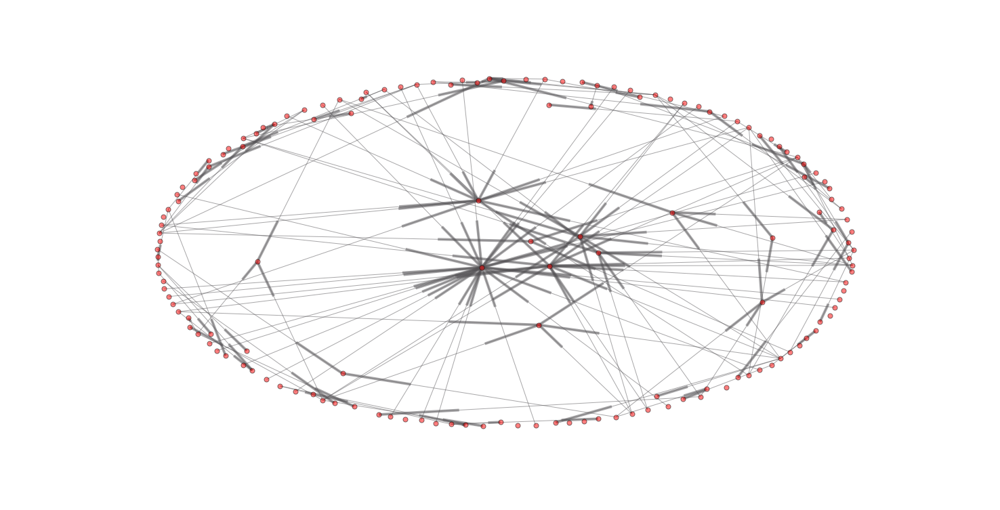

Name and Modularity for department(community) is: 'Department-of-Chemical-Engineering.csv'  0.600925249574


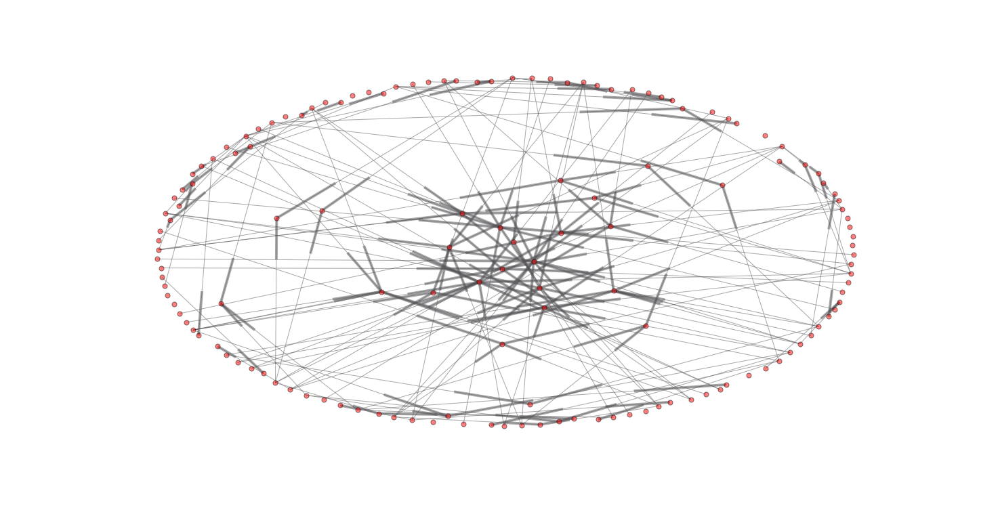

Name and Modularity for department(community) is: 'Department-of-Photonics-Engineering.csv'  0.6858984375


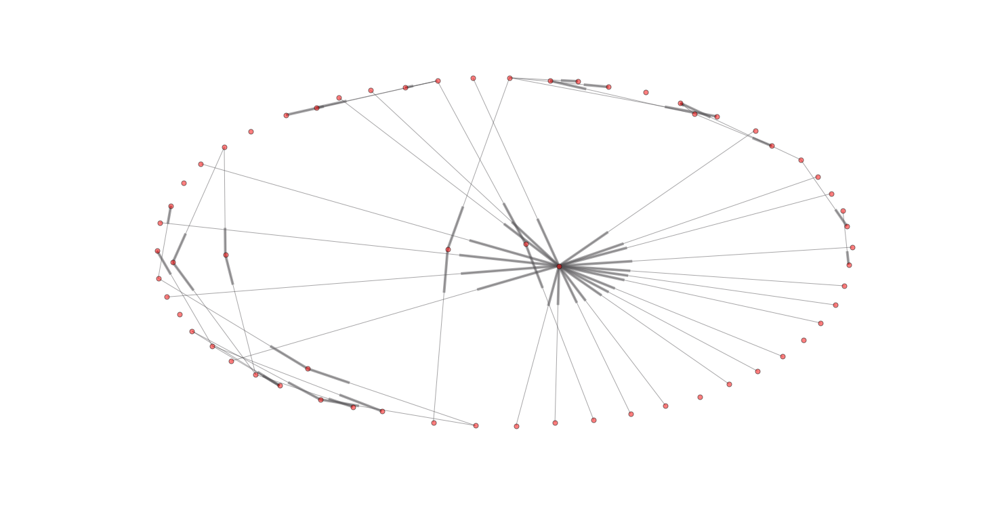

Name and Modularity for department(community) is: 'National-Food-Institute.csv'  0.0


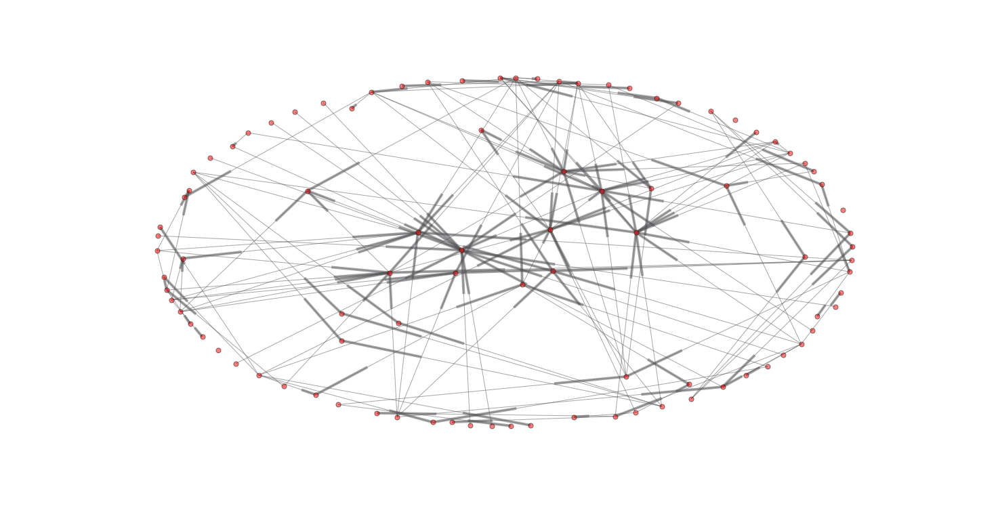

Name and Modularity for department(community) is: 'Department-of-Systems-Biology.csv'  0.611981329852


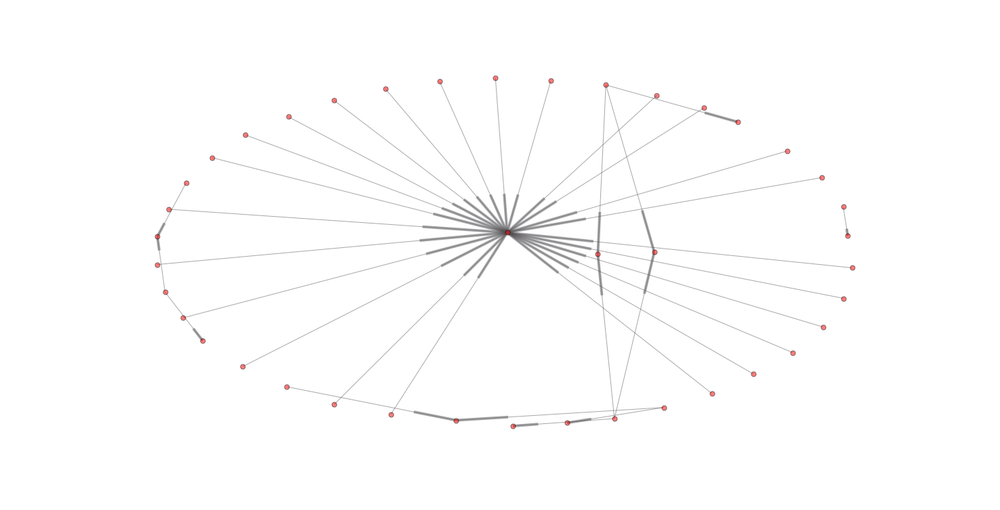

Name and Modularity for department(community) is: 'National-Institute-of-Aquatic-Resources.csv'  0.0


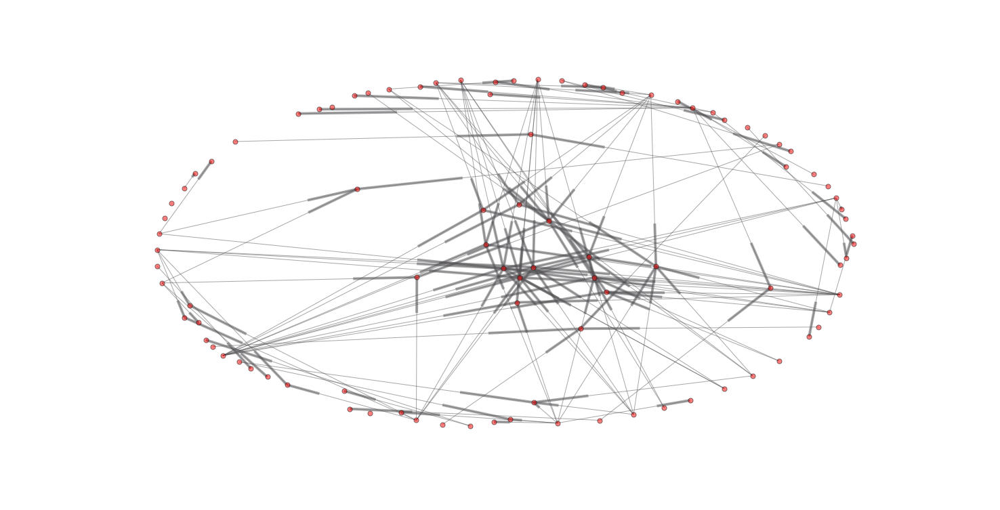

Name and Modularity for department(community) is: 'National-Space-Institute.csv'  0.432257811888


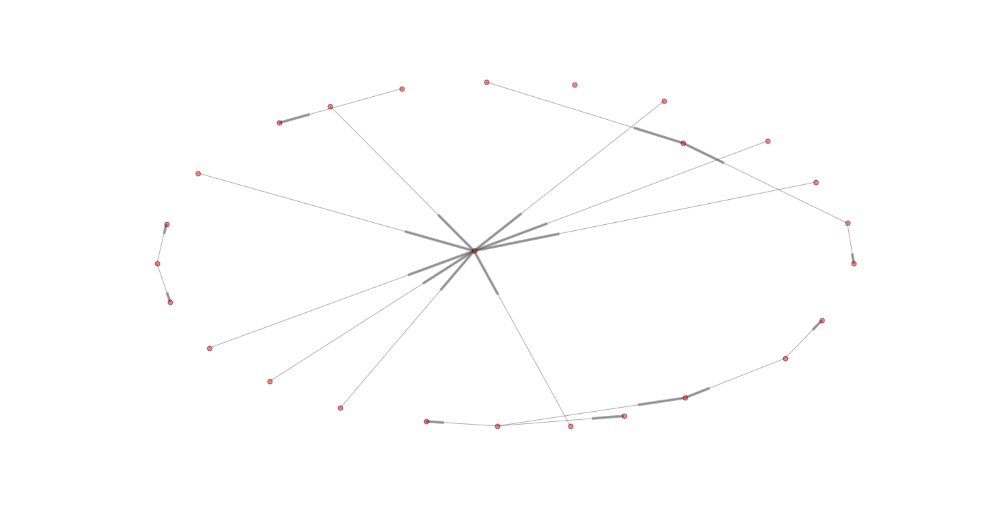

Name and Modularity for department(community) is: 'Other-courses.csv'  0.0


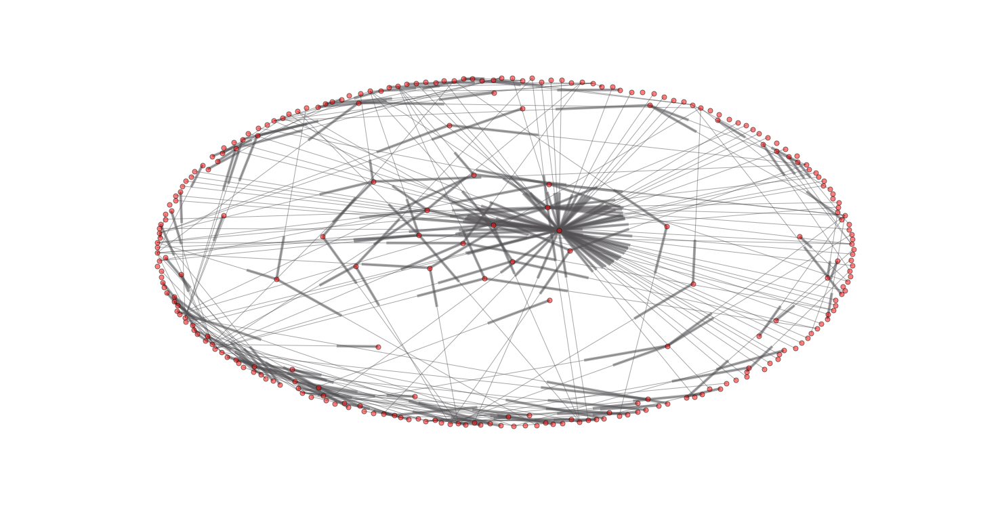

Name and Modularity for department(community) is: 'DTU-Management-Engineering.csv'  0.738076923077


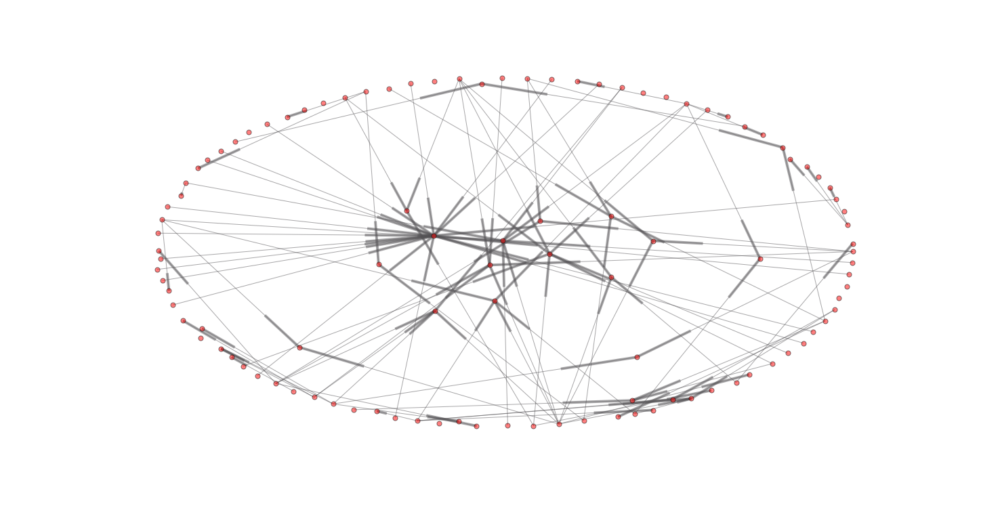

Name and Modularity for department(community) is: 'Department-of-Chemistry.csv'  0.637785467128


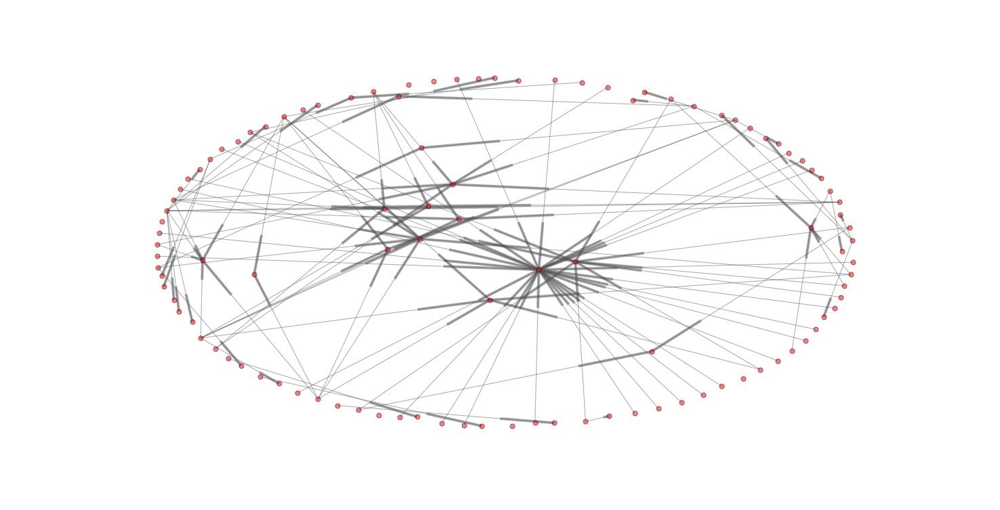

Name and Modularity for department(community) is: 'Department-of-Physics.csv'  0.548163389727


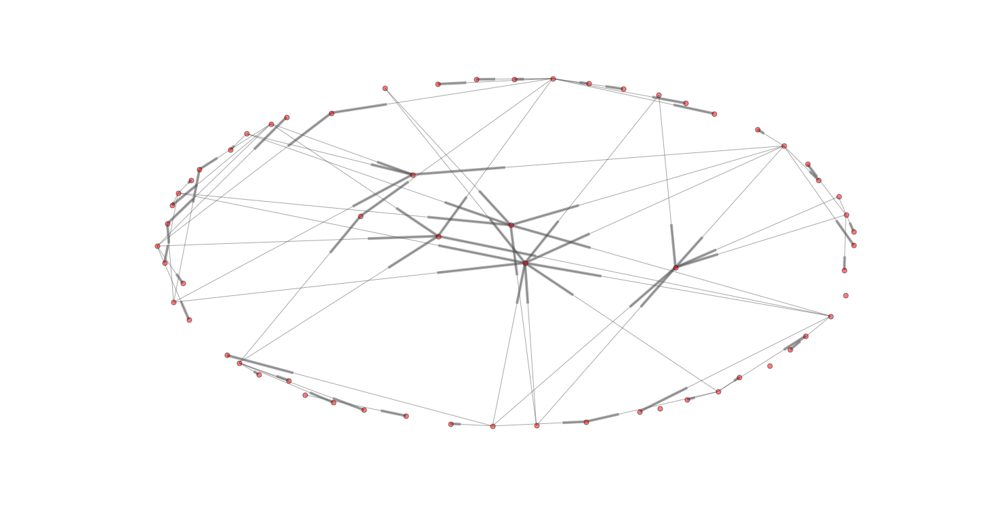

Name and Modularity for department(community) is: 'DTU-Wind-Energy.csv'  0.587384259259


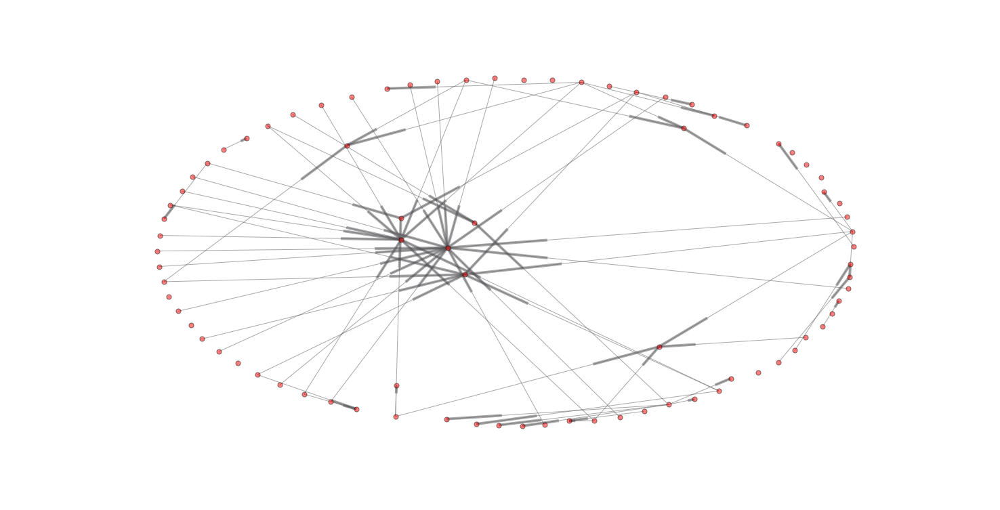

Name and Modularity for department(community) is: 'Department-of-Environmental-Engineering.csv'  0.602652825836


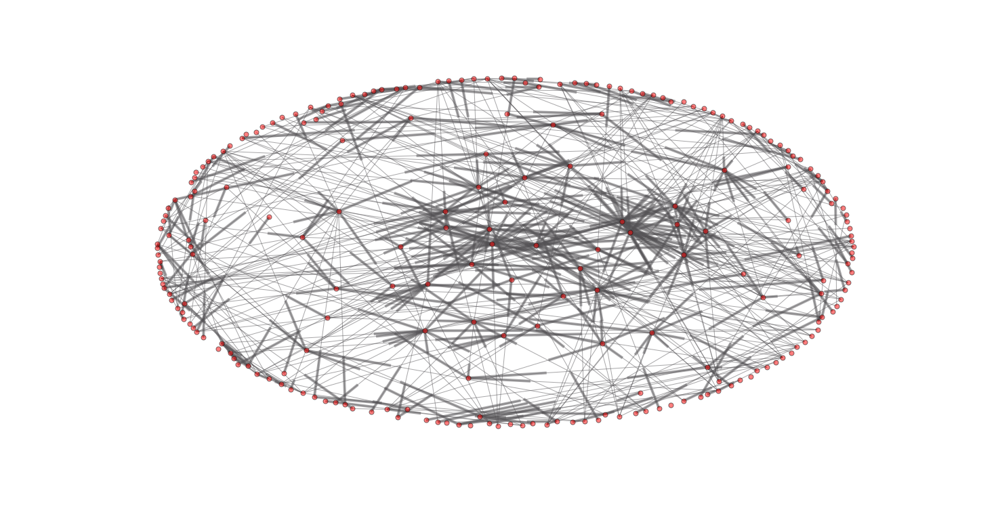

Name and Modularity for department(community) is: 'Department-of-Mechanical-Engineering.csv'  0.67481437165


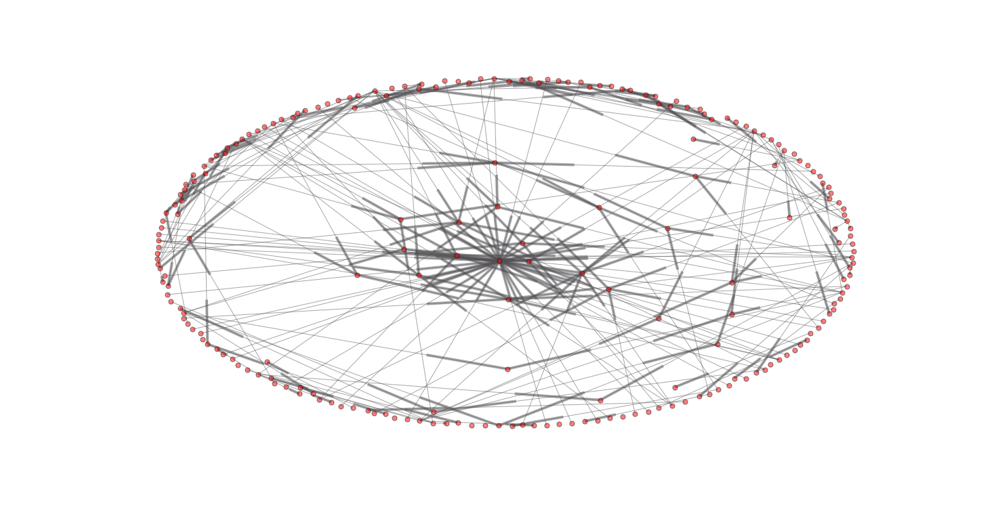

Name and Modularity for department(community) is: 'Department-of-Civil-Engineering.csv'  0.74608268493


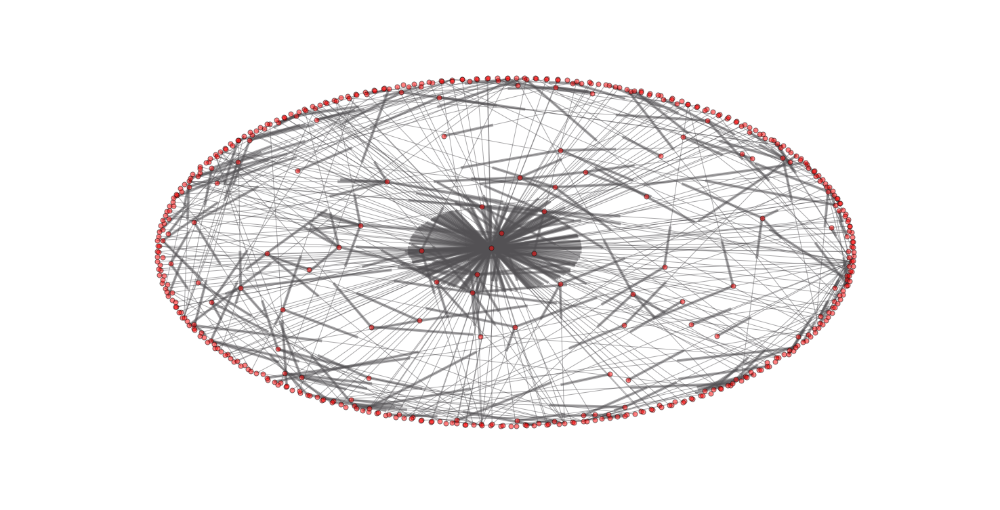

Name and Modularity for department(community) is: 'DTU-Diplom.csv'  0.0


In [56]:
list_of_dicts=[]
for i in range(0,len(new_list_of_dicts.keys())):
    list_of_dicts.append(department_pic(new_list_of_dicts.values()[i],new_list_of_dicts.keys()[i]))

In [57]:
#printing out the modularity value of each department
print "The modularity for each department(community) is: \n"
for k,v in dict(list_of_dicts).items():
    print k,v

The modularity for each department(community) is: 

Department-of-Systems-Biology.csv 0.611981329852
Department-of-Electrical-Engineering.csv 0.785183983123
Department-of-Applied-Mathematics-and-Computer-Science.csv 0.683374167899
Department-of-Transport.csv 0.166666666667
Department-of-Micro-and-Nanotechnology.csv 0.0
National-Institute-of-Aquatic-Resources.csv 0.0
Department-of-Physics.csv 0.548163389727
Department-of-Photonics-Engineering.csv 0.6858984375
DTU.csv 0.5656
National-Food-Institute.csv 0.0
National-Veterinary-Institute.csv 0.3671875
Other-courses.csv 0.0
DTU-Management-Engineering.csv 0.738076923077
Department-of-Chemistry.csv 0.637785467128
Department-of-Chemical-Engineering.csv 0.600925249574
DTU-Wind-Energy.csv 0.587384259259
National-Space-Institute.csv 0.432257811888
DTU-Diplom.csv 0.0
Department-of-Mechanical-Engineering.csv 0.67481437165
Department-of-Civil-Engineering.csv 0.74608268493
Department-of-Environmental-Engineering.csv 0.602652825836


In [58]:
overall_mod=sum(dict(list_of_dicts).values())/len(dict(list_of_dicts).values())
print "The overall modularity is %r"%overall_mod

The overall modularity is 0.4492397651481369


In [59]:
H = G.to_undirected()

In [60]:
#using  networkx to create the prober subgraph using the weakly connected component (WCC)
#generating corresponding undirected graph to the philosopher directed graph

G = max(nx.weakly_connected_component_subgraphs(G,copy=True),key=len)
H = G.to_undirected()

In [61]:
#networkx function to get the assortativity
r = nx.degree_assortativity_coefficient(H)
print "Assortativity of the undirected graph: %s" %r

Assortativity of the undirected graph: -0.62051031276


In [62]:
#using the community package to calculate the modularity using the Louvain-algroithm
#for directed graphs the partition has to be set manually. in our case we can set it to represent the 21 departments
part = community.best_partition(H)


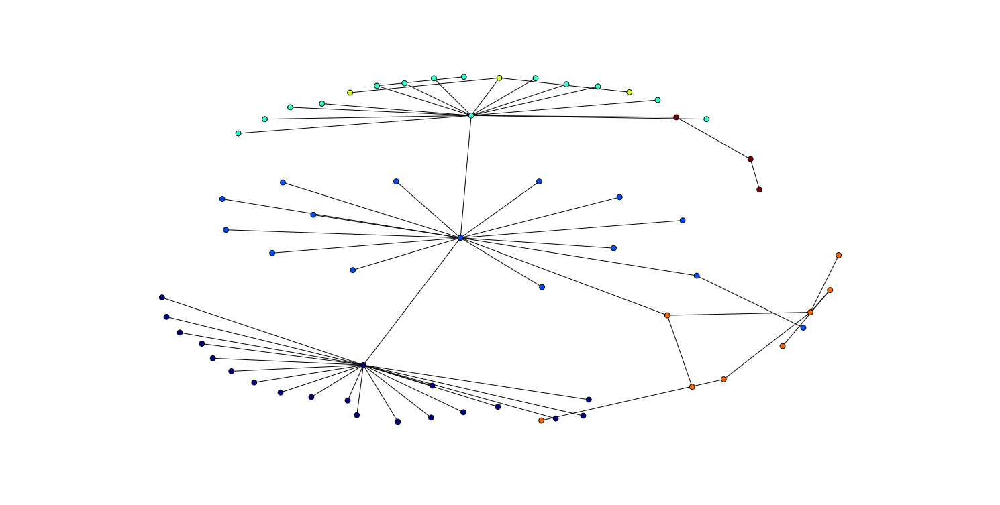

In [63]:
part = community.best_partition(H)
pos=nx.spring_layout(H, scale=5)
values = [part.get(node) for node in H.nodes()]
plt.figure(num=None, figsize=(20, 10), dpi=1500)    
nx.draw_spring(H, cmap = plt.get_cmap('jet'), node_color = values, node_size=60, with_labels=False)
plt.savefig('C:/Users/DRC/Desktop/project for social graphs study/webpage for social graph study/department_fig.png')
plt.show()

In [64]:
mod = community.modularity(part,H)
print "The overall modularity for the department based network is:", mod

The overall modularity for the department based network is: 0.685353798127


Comparable to the modularity of the whole network. We see that the modularity is much higher, so the departments are not the best way of defining the communities.

In [65]:
#new_dict_list_of_links.items()[45]
nx.write_graphml(G, 'graph_text.png')

# Part 3: Wordclouds

We used the text in the content description of each course within each department to identify what is weighted in each department and visualize using wordclouds. 

In [66]:
import re
import nltk
import string
from sklearn.feature_extraction.text import TfidfVectorizer
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
import os
import pandas as pd
from wordcloud import WordCloud
import numpy as np
import operator
import math
import community
from collections import Counter
import itertools
from nltk.corpus import stopwords
%matplotlib inline

In [67]:
dirroot='C:/Users/DRC/Desktop/social_csv_folder'
list_of_departments=[]
for filename in os.listdir(dirroot):
    if filename.endswith('.csv'):
        #print dirroot+'/'+filename
        df=pd.read_csv(dirroot+'/'+filename)
        list_of_departments.append(df)

In [68]:

con_dic = {k: [] for k in [a for a in os.listdir(dirroot) if a.endswith('.csv')]}
stop_words = stopwords.words('english')
stemmer = nltk.stem.porter.PorterStemmer()
for filename in con_dic:
    con_dic[filename] = pd.read_csv(dirroot+'/'+filename,dtype=object).dropna(how='all')
    con_dic[filename] = con_dic[filename]['CONTENT'].tolist()
    con_dic[filename] = [nltk.word_tokenize(re.sub('[^A-Za-z]+',' ', wds.decode('utf-8').lower())) for wds in con_dic[filename]]
    con_dic[filename] = [' '.join(list((set(smart)-set(stop_words)-set(['course'])))) for smart in con_dic[filename]]
    #con_dic[filename] = [' '.join([stemmer.stem(st) for st in item]) for item in con_dic[filename]]
    #con_dic[filename] = dict(enumerate(con_dic[filename],1))

In [69]:
new_condic = {}
vect = {}
#vectorizer = TfidfVectorizer(stop_words='english',decode_error='ignore',
                             #strip_accents='unicode',smooth_idf=True,max_df=0.9,use_idf=True)
for depts in con_dic:
    vect[depts] = TfidfVectorizer(stop_words='english',decode_error='ignore', 
                                 strip_accents='unicode',smooth_idf=True,max_df=0.9,use_idf=True)
    new_condic[depts] = vect[depts].fit_transform(con_dic[depts])
    #new_condic[depts] = new_condic[depts].todense().tolist()

In [70]:
lll = {k: '' for k in [a for a in os.listdir(dirroot) if a.endswith('.csv')]}
kkk = {k: [] for k in [a for a in os.listdir(dirroot) if a.endswith('.csv')]}
for dep in new_condic:
    for p in range(len(new_condic[dep].todense().tolist())):
        kkk[dep].extend(zip(vect[dep].get_feature_names(),new_condic[dep].todense().tolist()[p]))
    kkk[dep] = [(i,j+0.999) for i,j in list(set(kkk[dep])) if j!=0]
    for t,c in kkk[dep]:
        lll[dep] = lll[dep]+(t+' ')*int(round(c))

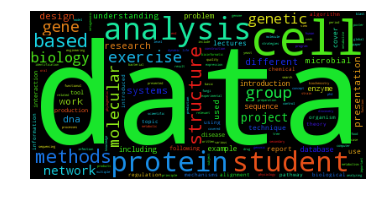

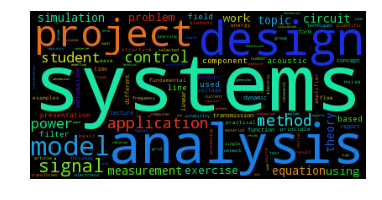

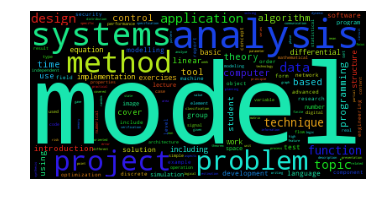

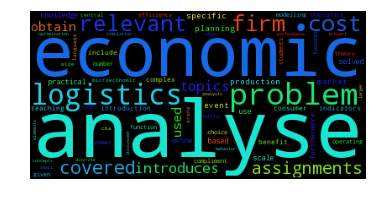

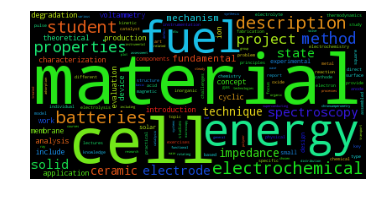

...

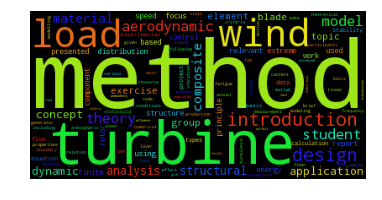

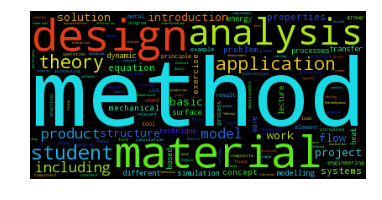

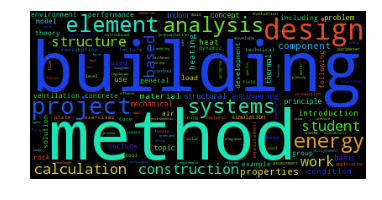

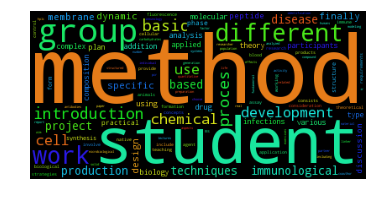

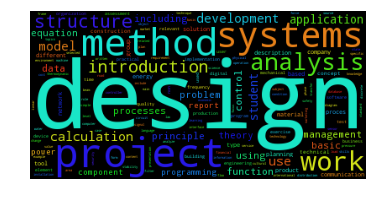

In [71]:
for dpts in lll:
    wordcloud = WordCloud().generate(lll[dpts])
    img=plt.imshow(wordcloud)
    plt.axis("off")
    plt.savefig('C:/Users/DRC/Desktop/project for social graphs study/wordclouds/'+dpts+".png")
    plt.show()

These wordclouds are interestting indicators for what is weighted more in each department. This can be useful for student who are not sure of which education they want or which department of education they mostly relate too. Having a list (or a visual stimulating cloud) of terms can help narrow down that search e.g. a studen who wants his education to weight on economy could search for department wordcloud that majorily (size-wise) contain the word "economy"(or similar) and finds his/her education within it. This is achieved using vectorization i.e. tf-idf of the words which consist of a pre-process using natrual language processing (NLTK).


# Part 4: Teachers network

Trying to create a network of teachers

In [72]:
dirroot='C:/Users/DRC/Desktop/social_csv_folder'


con_dic = {k: [] for k in [a for a in os.listdir(dirroot) if a.endswith('.csv')]}
stop_words = stopwords.words('english')
stemmer = nltk.stem.porter.PorterStemmer()
for filename in con_dic:
    con_dic[filename] = pd.read_csv(dirroot+'/'+filename,dtype=object).dropna(how='all')
    con_dic[filename] = con_dic[filename]['CONTENT'].tolist()
    con_dic[filename] = [nltk.word_tokenize(re.sub('[^A-Za-z]+',' ', wds.decode('utf-8').lower())) for wds in con_dic[filename]]
    con_dic[filename] = [' '.join(list((set(smart)-set(stop_words)-set(['course'])))) for smart in con_dic[filename]]
    #con_dic[filename] = [' '.join([stemmer.stem(st) for st in item]) for item in con_dic[filename]]
    #con_dic[filename] = dict(enumerate(con_dic[filename],1))

In [73]:

teach_dic = {k: [] for k in [a for a in os.listdir(dirroot) if a.endswith('.csv')]}




for filename in con_dic:
    teach_dic[filename] = pd.read_csv(dirroot+'/'+filename,dtype=object).dropna(how='all')
    #con_dic[filename] = con_dic[filename]['CONTENT'].tolist()
    #con_dic[filename] = [nltk.word_tokenize(re.sub('[^A-Za-z]+',' ', wds.decode('utf-8').lower())) for wds in con_dic[filename]]
    #con_dic[filename] = [' '.join(list((set(smart)-set(stop_words)-set(['course'])))) for smart in con_dic[filename]]
    #con_dic[filename] = [' '.join([stemmer.stem(st) for st in item]) for item in con_dic[filename]]
    #con_dic[filename] = dict(enumerate(con_dic[filename],1))
uber_dict={}
for i in con_dic.keys():
    course_responsible = {}
    for index, row in teach_dic[i].iterrows():
        rw = re.sub('\s+', ' ',row['COURSE RESPONSIBLE'])
        for tech in [y.strip() for y in rw.split(',')]:
            try:
                course_responsible[tech].extend(row['COURSE NUMBER'].split())
            except:
                course_responsible[tech] = [row['COURSE NUMBER']]
    uber_dict[i]=course_responsible
    

In [74]:
super_duper_dict={}
for k, v in uber_dict.items():
    list_of_teachers=[]
    for k2,v2 in v.items():
        list_of_teachers.append(k2)
    super_duper_dict[k]=list_of_teachers

In [75]:
B=nx.Graph(super_duper_dict)

In [76]:
list_of_color_nodes=[]
for i in B.nodes():
    if 'csv' in i:
        list_of_color_nodes.append(i)
#list_of_color_nodes

In [77]:
color_map=[]
for node in B:
    if node in list_of_color_nodes:
        color_map.append('blue')
    else:
        color_map.append('red')

In [78]:
labels = {}    
for node in B.nodes():
    if node in list_of_color_nodes:
        #set the node name as the key and the label as its value 
        labels[node] = node


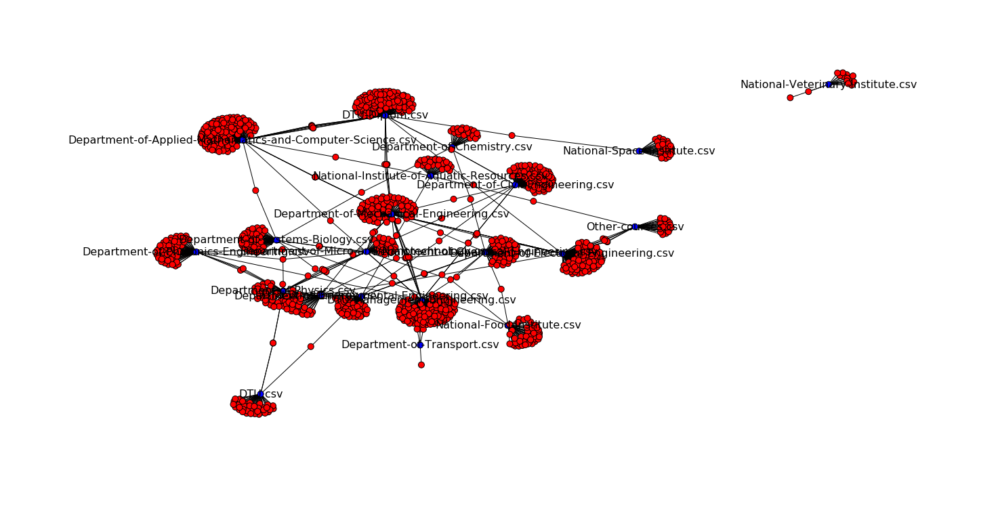

In [79]:
plt.figure(num=None, figsize=(20, 10), dpi=1500)          
#set the argument 'with labels' to False so you have unlabeled graph
pos=nx.spring_layout(B, scale=5)
nx.draw(B,pos,node_color=color_map,with_labels=False,node_size=80)
#Now only add labels to the nodes you require (the hubs in my case)
nx.draw_networkx_labels(B,pos,labels,font_size=16,font_color='black')
plt.savefig('C:/Users/DRC/Desktop/project for social graphs study/webpage for social graph study/teacher_network.png')
plt.show()

This network visualizes how the teaches are connected across departments by which teacher's name appear in each department

In [80]:
#possibly do some more analysis on this netowrk 

In [81]:
teacher_dic=nx.betweenness_centrality(B)

In [82]:
department_centrality={}
for k,v in teacher_dic.items():
    if k in labels.values():
        department_centrality[k]=v

In [83]:
#ranking the most central department i.e. most well connected departments by teacher
print "The ranking of the departments in the teachers network is: \n"
for k,v in sorted(department_centrality.items(), key=lambda x:x[1],reverse=True):
    print k,v


The ranking of the departments in the teachers network is: 

Department-of-Mechanical-Engineering.csv 0.331165165718
Department-of-Applied-Mathematics-and-Computer-Science.csv 0.255187245052
DTU-Management-Engineering.csv 0.241006773754
DTU-Diplom.csv 0.233125365989
Department-of-Micro-and-Nanotechnology.csv 0.182001269013
Department-of-Electrical-Engineering.csv 0.16419889873
Department-of-Civil-Engineering.csv 0.162682889437
Department-of-Environmental-Engineering.csv 0.156865813099
Department-of-Chemical-Engineering.csv 0.146487264041
Department-of-Systems-Biology.csv 0.11884569099
Department-of-Photonics-Engineering.csv 0.105719545961
Department-of-Physics.csv 0.104769397632
National-Food-Institute.csv 0.0766515133072
DTU.csv 0.0699286991041
DTU-Wind-Energy.csv 0.0674661726089
National-Institute-of-Aquatic-Resources.csv 0.0663865135928
National-Space-Institute.csv 0.0442311853822
Department-of-Chemistry.csv 0.0414120573771
Other-courses.csv 0.0398747557566
Department-of-Transport.c